# Hyperion project
- Jacopo Umberto Verga
- Neighborhood analysis: 6$\mu$m

In [1]:
import squidpy as sq
import scanpy as sc
import scanpy as sc
import anndata as ad
import os
import sys
import pandas as pd
import numpy as np
import tifffile as tf
import matplotlib.pyplot as plt
from matplotlib.colors import to_hex
import seaborn as sns
import time
import gc
from sklearn.mixture import GaussianMixture
import warnings
warnings.filterwarnings("ignore")

In [2]:
adata = sc.read('../data/non_denoised/spe_final.h5ad')

# Spatial analysis

## Select baseline

In [3]:
adata=adata[adata.obs['timepoint'] == 'Baseline']
adata

View of AnnData object with n_obs × n_vars = 373463 × 36
    obs: 'area', 'centroid-0', 'centroid-1', 'axis_major_length', 'axis_minor_length', 'eccentricity', 'Cell_ID', 'library_id', 'sample_id', 'ObjectNumber', 'width_px', 'height_px', 'major_celltype', 'major_cell_type', 'minor_cell_type', 'Ki-67_minor_cell_type', 'PD-L1_minor_cell_type', 'PD-1_minor_cell_type', 'pSTAT1_minor_cell_type', 'TIM-3_minor_cell_type', 'tissue_id', 'slide_id', 'timepoint', 'patient_n', 'DFCI_id', 'MRN', 'medium_cell_type', 'Ki-67_medium_cell_type', 'PD-L1_medium_cell_type', 'PD-1_medium_cell_type', 'pSTAT1_medium_cell_type', 'TIM-3_medium_cell_type', 'functional_minor_cell_type'
    uns: 'spatial'
    obsm: 'PCA', 'UMAP_mnnCorrected', 'fastMNN', 'spatial'
    layers: 'exprs', 'logcounts'

## Remove unwanted cells and add medium labels

In [4]:
adata=adata[~adata.obs['minor_cell_type'].isin(['B-T','Unclassified','Artifact'])]
adata=adata[~adata.obs['medium_cell_type'].isin(['B-T','Unclassified','Artifact','Other T'])]
adata=adata[~adata.obs['major_cell_type'].isin(['B-T','Unclassified','Artifact'])]
adata

View of AnnData object with n_obs × n_vars = 314419 × 36
    obs: 'area', 'centroid-0', 'centroid-1', 'axis_major_length', 'axis_minor_length', 'eccentricity', 'Cell_ID', 'library_id', 'sample_id', 'ObjectNumber', 'width_px', 'height_px', 'major_celltype', 'major_cell_type', 'minor_cell_type', 'Ki-67_minor_cell_type', 'PD-L1_minor_cell_type', 'PD-1_minor_cell_type', 'pSTAT1_minor_cell_type', 'TIM-3_minor_cell_type', 'tissue_id', 'slide_id', 'timepoint', 'patient_n', 'DFCI_id', 'MRN', 'medium_cell_type', 'Ki-67_medium_cell_type', 'PD-L1_medium_cell_type', 'PD-1_medium_cell_type', 'pSTAT1_medium_cell_type', 'TIM-3_medium_cell_type', 'functional_minor_cell_type'
    uns: 'spatial'
    obsm: 'PCA', 'UMAP_mnnCorrected', 'fastMNN', 'spatial'
    layers: 'exprs', 'logcounts'

## Neighbourhood graph

In [5]:
radius=30.

In [6]:
sq.gr.spatial_neighbors(adata,
                        spatial_key='spatial',
                        library_key='library_id',
                        coord_type='generic',
                        radius=radius,
                        delaunay=False,
                        key_added='ng_six')

In [7]:
adata

AnnData object with n_obs × n_vars = 314419 × 36
    obs: 'area', 'centroid-0', 'centroid-1', 'axis_major_length', 'axis_minor_length', 'eccentricity', 'Cell_ID', 'library_id', 'sample_id', 'ObjectNumber', 'width_px', 'height_px', 'major_celltype', 'major_cell_type', 'minor_cell_type', 'Ki-67_minor_cell_type', 'PD-L1_minor_cell_type', 'PD-1_minor_cell_type', 'pSTAT1_minor_cell_type', 'TIM-3_minor_cell_type', 'tissue_id', 'slide_id', 'timepoint', 'patient_n', 'DFCI_id', 'MRN', 'medium_cell_type', 'Ki-67_medium_cell_type', 'PD-L1_medium_cell_type', 'PD-1_medium_cell_type', 'pSTAT1_medium_cell_type', 'TIM-3_medium_cell_type', 'functional_minor_cell_type'
    uns: 'spatial', 'ng_six_neighbors'
    obsm: 'PCA', 'UMAP_mnnCorrected', 'fastMNN', 'spatial'
    layers: 'exprs', 'logcounts'
    obsp: 'ng_six_connectivities', 'ng_six_distances'

In [8]:
from anndata import AnnData
from spatialdata import SpatialData
from pandas import DataFrame
from collections.abc import Iterable, Sequence


def summ_aggr(aggr_neigh:DataFrame,
              statistic: str = ["mean", "median", "sd", "var"]
             ) -> DataFrame:
    if statistic == "mean":
        aggr_neigh=aggr_neigh.groupby(['from', 'variable'])['value'].mean().reset_index()
    elif statistic == "median":
        aggr_neigh=aggr_neigh.groupby(['from', 'variable'])['value'].median().reset_index()
    elif statistic == "std":
        aggr_neigh=aggr_neigh.groupby(['from', 'variable'])['value'].std().reset_index()
    elif statistic == "var":
        aggr_neigh=aggr_neigh.groupby(['from', 'variable'])['value'].var().reset_index()
    return aggr_neigh


def aggregateNeighbors(
    adata: AnnData | SpatialData,
    connectivity_key: str | None = None,
    aggregate_by: str = ["metadata", "expression"],
    count_by: str | None = None,
    proportions: bool = False,
    layer : str| None = None,
    var_names: str | Sequence[str | None] | None = None,
    statistic: str = ["mean", "median", "sd", "var"],
    name: str | None = None,
    copy: bool = True,
) -> DataFrame | None:
    """
    
    """
    # get connectivities
    adj = adata.obsp[connectivity_key]
    # trasform connectivities to a pandas dataframe with 'to' and 'from' columns
    aggr_neigh=pd.DataFrame({
        'from': adj.tocoo().row,
        'to': adj.tocoo().col
    })

    index_to_cell={i:cell for i,cell in enumerate(adata.obs_names)}
    if aggregate_by == "metadata":
        # get categories from adata.obs
        categories = adata.obs[count_by].values
        # add celltype column with chosen catagories
        aggr_neigh['celltype'] = categories[aggr_neigh['to']]
        # make the table wide with the columns 'from' and categories, values are the counts of each category for each 'to' cell
        aggr_neigh=aggr_neigh.pivot_table(index='from', columns='celltype', aggfunc='size', fill_value=0)
        if proportions:
            all_cols = aggr_neigh.columns
            row_sums = aggr_neigh.sum(axis=1)
            aggr_neigh = aggr_neigh.div(row_sums, axis=0)
        name='aggregatedNeighbors' if name == None else name
    else:
        if var_names is None:
            var_names = adata.var_names
        # get expression counts
        counts=pd.DataFrame(adata[:, var_names].layers[layer])
        counts.columns=var_names
        counts['to'] = counts.index
        # merge counts and connectivities
        aggr_neigh=pd.merge(aggr_neigh,counts,on='to',how='left')
        # melt aggr_neigh to have one row for eac to, from, gene match
        aggr_neigh=aggr_neigh.melt(id_vars=['from','to'])
        # summarize values
        aggr_neigh=summ_aggr(aggr_neigh_, statistic)
        aggr_neigh=aggr_neigh.pivot_table(index='from',columns='variable',values='value')
        
        name=statistic+'_aggregatedNeighbors' if name == None else name

    # replace indexes with cell identifiers
    aggr_neigh = aggr_neigh.reset_index()
    aggr_neigh['from']=aggr_neigh['from'].map(index_to_cell)
    aggr_neigh.index = aggr_neigh['from']
    del aggr_neigh['from']

    if copy:
        adata.uns[name] = aggr_neigh
        return adata
    return aggr_neigh



## Cell Neighbourhood analysis:

- Aggregate negihbour: create a vector describing cell neighbourhood for each cell
- Kmeans clustering

In [9]:
adata=aggregateNeighbors(adata=adata,
                   connectivity_key='ng_six_connectivities',
                   aggregate_by= "metadata",
                   count_by= "major_cell_type",
                   proportions = True,
                   layer='exprs',
                   var_names=None,
                   statistic="median",
                   name = None)

In [10]:
adata.uns.keys()

dict_keys(['spatial', 'ng_six_neighbors', 'aggregatedNeighbors'])

In [11]:
df=adata.uns['aggregatedNeighbors']

In [12]:
from sklearn.cluster import KMeans

y=df.index
X=df.reset_index(drop=True)


In [13]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=8, random_state=12345)
clusters=kmeans.fit_predict(X)


In [14]:
cn_celltypes=pd.merge(pd.DataFrame(index=adata.obs_names),
                      pd.DataFrame({'cn_celltypes':clusters},index=y).astype('str'),
                      left_index=True, 
                      right_index=True,
                      how='outer')
cn_celltypes['cn_celltypes']=cn_celltypes['cn_celltypes'].astype('str')
adata.obs['cn_celltypes'] = cn_celltypes

In [15]:
clusters=adata.obs[['cn_celltypes','minor_cell_type','medium_cell_type','major_cell_type']]

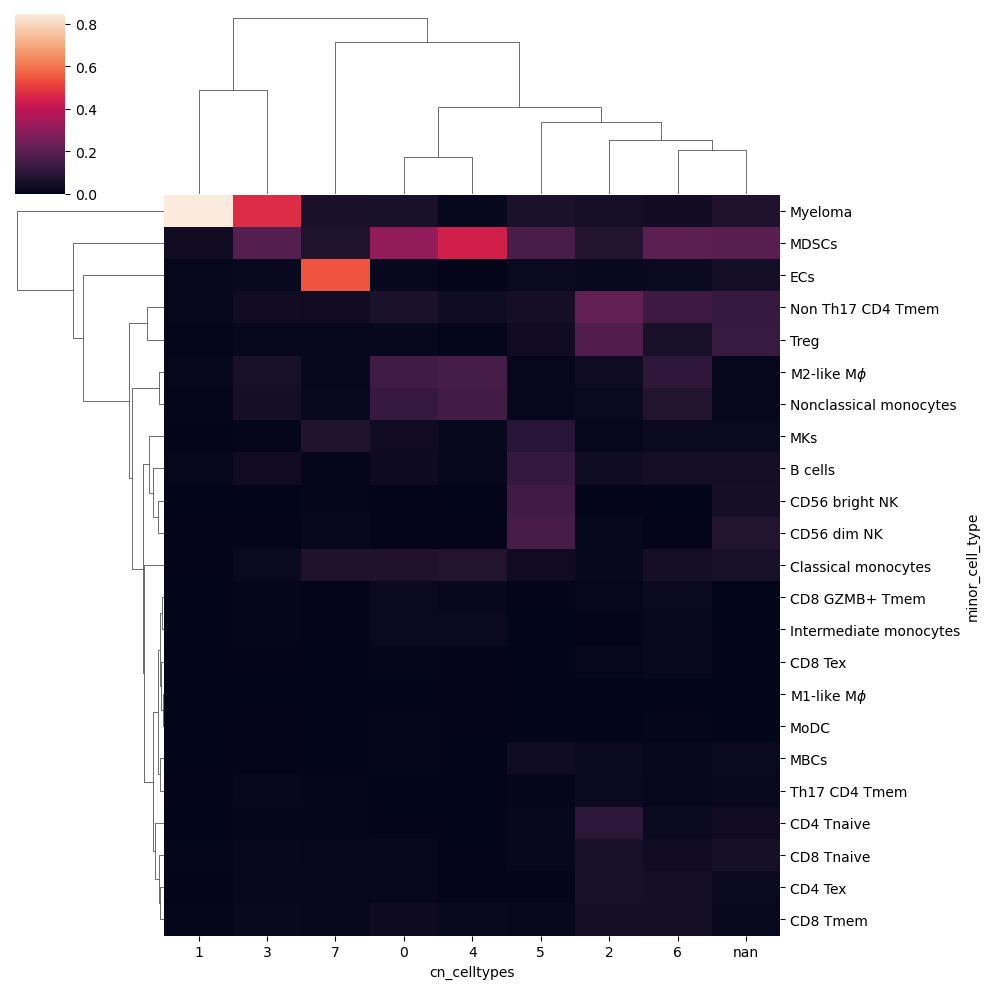

In [16]:
counts = clusters.groupby(['cn_celltypes', 'minor_cell_type']).size().reset_index(name='count')

total_counts = clusters.groupby('cn_celltypes').size().reset_index(name='total_count')

counts = counts.merge(total_counts, on='cn_celltypes')

counts['proportion'] = counts['count'] / counts['total_count']

proportions = counts.drop(columns=['count', 'total_count'])
sns.clustermap(proportions.pivot_table(index='minor_cell_type',columns='cn_celltypes',values='proportion'))

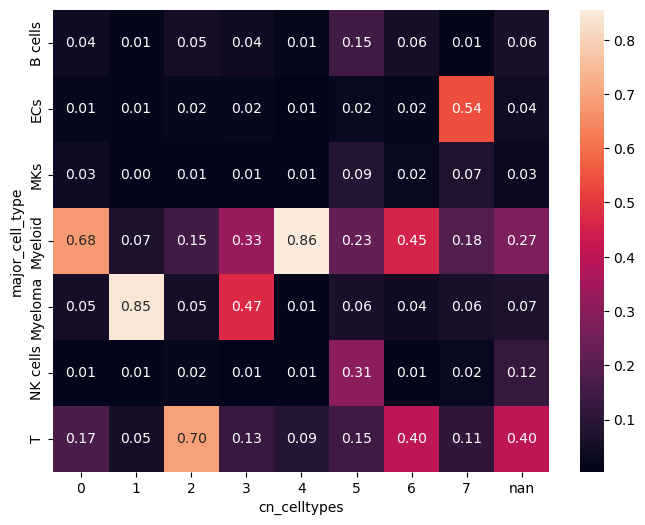

In [17]:
counts = clusters.groupby(['cn_celltypes', 'major_cell_type']).size().reset_index(name='count')

total_counts = clusters.groupby('cn_celltypes').size().reset_index(name='total_count')

counts = counts.merge(total_counts, on='cn_celltypes')

counts['proportion'] = counts['count'] / counts['total_count']

proportions = counts.drop(columns=['count', 'total_count'])
plt.figure(figsize=(8,6))
sns.heatmap(proportions.pivot_table(index='major_cell_type',columns='cn_celltypes',values='proportion'),
               annot=True,fmt='.2f')
plt.show()

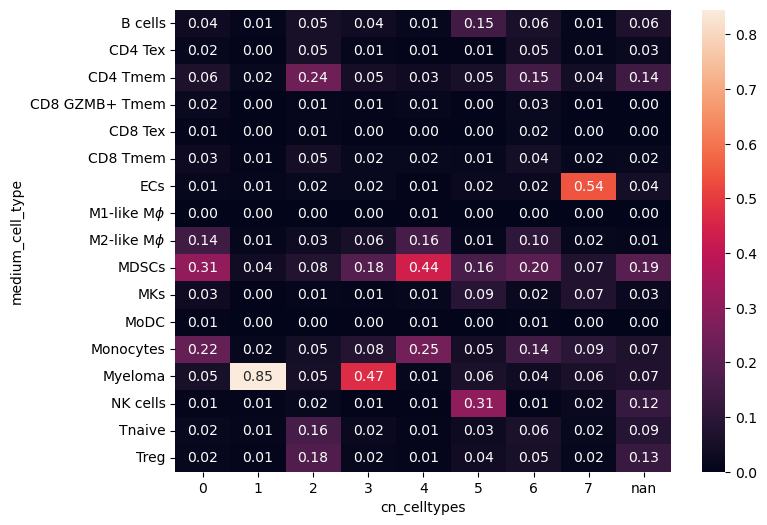

In [18]:
counts = clusters.groupby(['cn_celltypes', 'medium_cell_type']).size().reset_index(name='count')

total_counts = clusters.groupby('cn_celltypes').size().reset_index(name='total_count')

counts = counts.merge(total_counts, on='cn_celltypes')

counts['proportion'] = counts['count'] / counts['total_count']

proportions = counts.drop(columns=['count', 'total_count'])

plt.figure(figsize=(8,6))
sns.heatmap(proportions.pivot_table(index='medium_cell_type',columns='cn_celltypes',values='proportion'),
               annot=True,fmt='.2f')
plt.show()

Naming clusters:
- naming clusters by minor or medium cell labels results not trivial
- major cell types allow clean naming of the clusters
    - we can then consider minor and medium cell type proportions in each cluster

In [19]:
# cluster_map = {'0':'Myeloid',
#                '1':'Myeloma',
#               '2':'T',
#               '3':'Myeloma-MDSCs',
#               '4':'Myeloid',
#               '5':'Immune',
#               '6':'Immune',
#               '7':'Endothelial',
#               'nan':'Isolated'}
# adata.obs['cn_celltypes'] = adata.obs['cn_celltypes'].map(cluster_map)

In [20]:
# counts = clusters.groupby(['cn_celltypes', 'major_cell_type']).size().reset_index(name='count')

# total_counts = clusters.groupby('cn_celltypes').size().reset_index(name='total_count')

# counts = counts.merge(total_counts, on='cn_celltypes')

# counts['proportion'] = counts['count'] / counts['total_count']

# proportions = counts.drop(columns=['count', 'total_count'])

# proportions=proportions.pivot_table(index='major_cell_type',columns='cn_celltypes',values='proportion').T.reset_index()
# proportions['cn_celltypes']=proportions['cn_celltypes'].map(cluster_map)
# proportions.index=proportions['cn_celltypes']
# proportions=proportions.drop('cn_celltypes',axis=1)

# plt.figure(figsize=(8,6))
# sns.heatmap(proportions.T,
#                annot=True,fmt='.2f')
# plt.show()

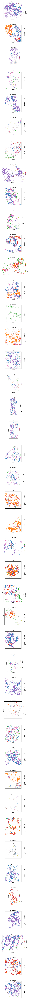

In [21]:
sq.pl.spatial_segment(
    adata,
    color="cn_celltypes",
    library_key="library_id",
    seg_cell_id="Cell_ID",
    img=False,
    outline=False,
    ncols=1)

In [22]:
areas=adata.obs[['area','DFCI_id','cn_celltypes']].groupby(['DFCI_id','cn_celltypes']).sum('area').reset_index()

### Areas each CN

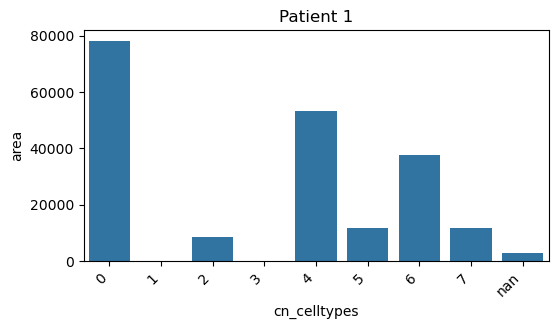

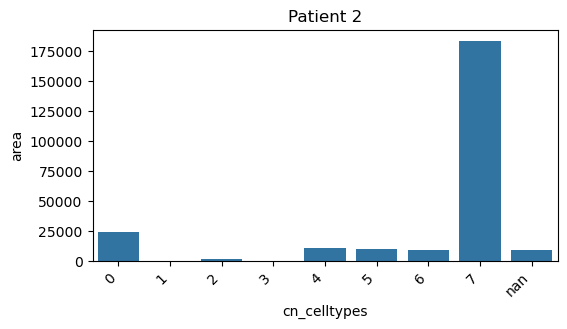

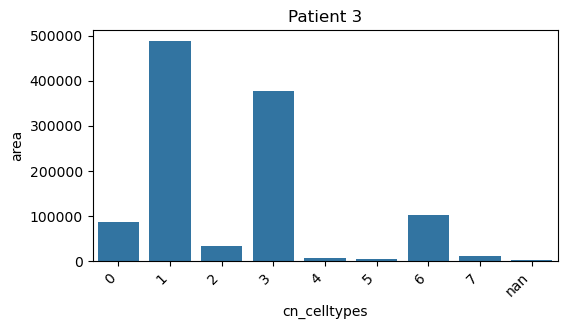

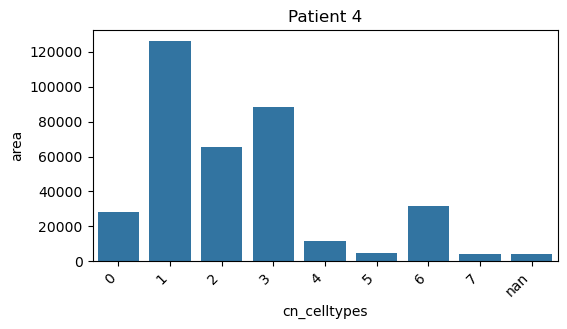

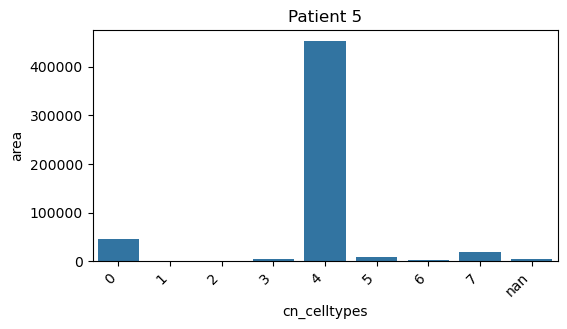

...

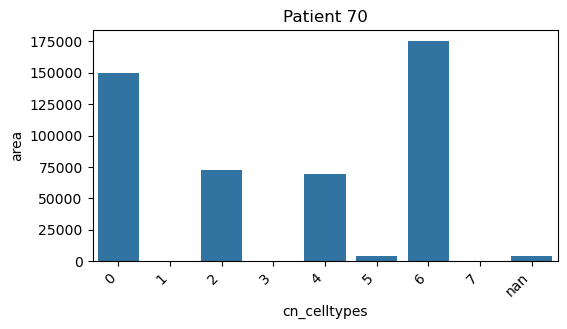

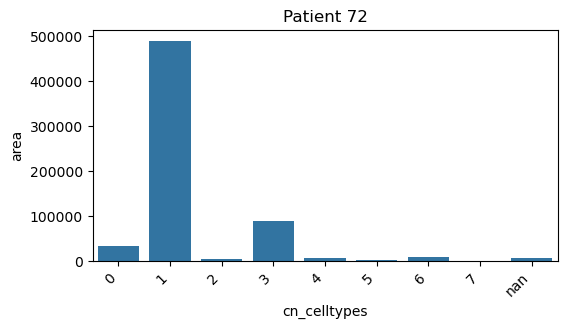

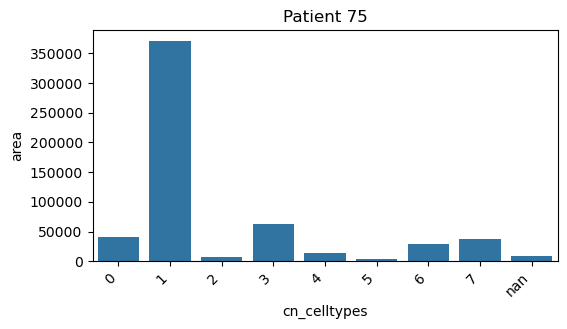

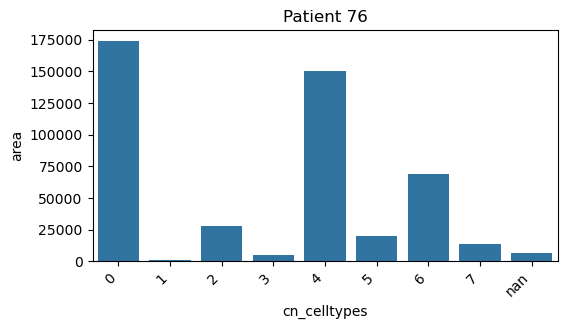

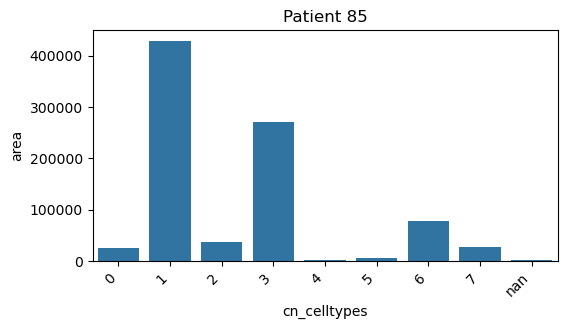

In [23]:
for patient in areas['DFCI_id'].unique():
    areas_tmp=areas[areas['DFCI_id']==patient][['cn_celltypes','area']]
    plt.figure(figsize=(6,3))
    sns.barplot(data=areas_tmp, x='cn_celltypes',y='area')
    plt.xticks(rotation=45,ha='right')
    plt.title(f"Patient {patient}")
    plt.show()

## spatial context analysis:

- Define CN composition for each cell neighbourhood
    - if > 90% of the neighbourhood is from one CN: SC = CN
    - Else SP = concat CN

In [24]:
adata=aggregateNeighbors(adata=adata,
                   connectivity_key='ng_six_connectivities',
                   aggregate_by= "metadata",
                   count_by= "cn_celltypes",
                   proportions = True,
                   layer='exprs',
                   var_names=None,
                   statistic="median",
                   name = 'aggregatedCN')

In [25]:
from numpy import array
from pandas import Series

# splitting function in more functions, please code tidy
def process_row(x:Series,
                threshold:float=0.9,
               ) -> str | float:
    # Sort the row in decreasing order and compute the cumulative sum
    sorted_indices = np.argsort(-x.values)  # Get indices that would sort the array in descending order
    sorted_values = x.values[sorted_indices]
    out = np.cumsum(sorted_values)

    
    # If sum not zero, we have CN
    if np.sum(out) != 0:
        col_names = x.index[sorted_indices]
        cur_out = col_names[:np.sum(out < threshold) + 1]
        
        # Sort the indices and concatenate them into a single string with underscores
        cur_out = "_".join(sorted(cur_out))

        return cur_out
    else:
        return np.nan

In [26]:
def detectSpatialContext(adata: AnnData | SpatialData,
                         neighbors_key: str | None = None,
                         threshold:float=0.9,
                         name: str | None = None,
                        copy:bool=True)-> DataFrame | None:
    aggr_neigh = adata.uns[neighbors_key]
    # replace whitespaces and underscores with dashes to keep tidy resulting spatial context
    aggr_neigh.columns = aggr_neigh.columns.str.replace(' ', '-')
    aggr_neigh.columns = aggr_neigh.columns.str.replace('_', '-')
    spatial_context=aggr_neigh.apply(lambda row: process_row(row, threshold), axis=1)
    if copy:
        adata.obs[name] = spatial_context
        return adata
    return pd.DataFrame(spatial_context)

In [27]:
adata=detectSpatialContext(adata,
                           neighbors_key='aggregatedCN',
                           name='SpatialContext')

In [ ]:
try:
    sq.pl.spatial_segment(adata,
                      color="SpatialContext",
                      library_key="library_id",
                      seg_cell_id="Cell_ID",
                      img=False,
                      outline=False,
                      ncols=1,
                      na_color='white')
except:
    pass

In [29]:
areas=adata.obs[['area','DFCI_id','SpatialContext']].groupby(['DFCI_id','SpatialContext']).sum('area').reset_index()

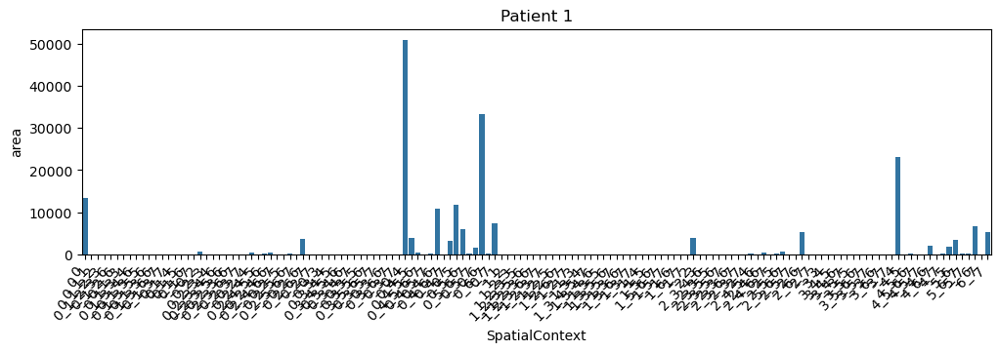

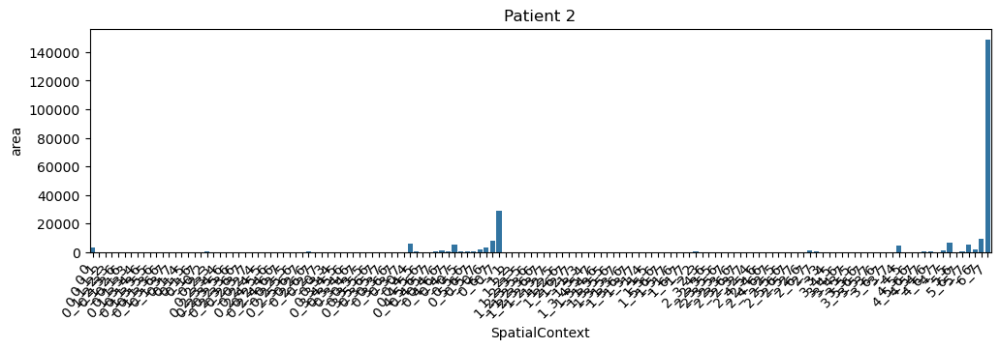

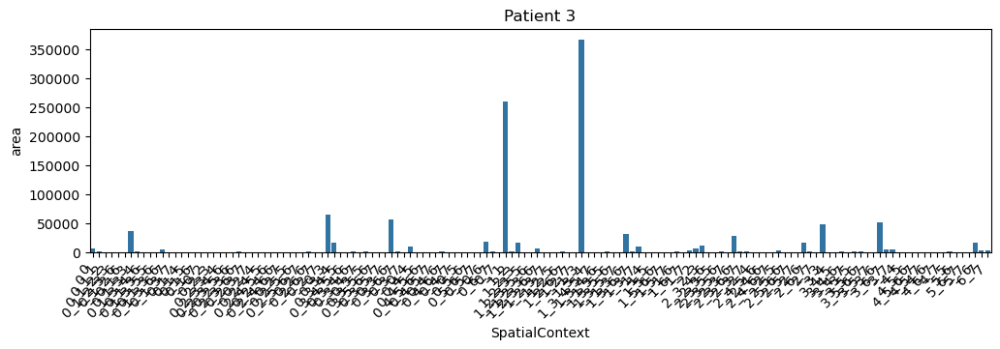

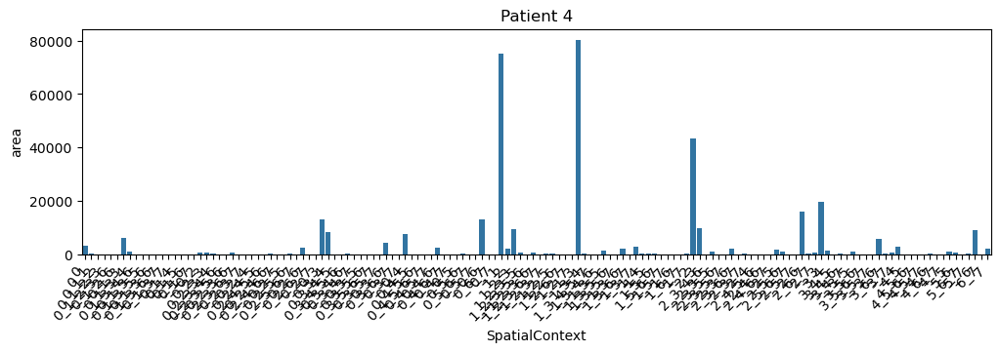

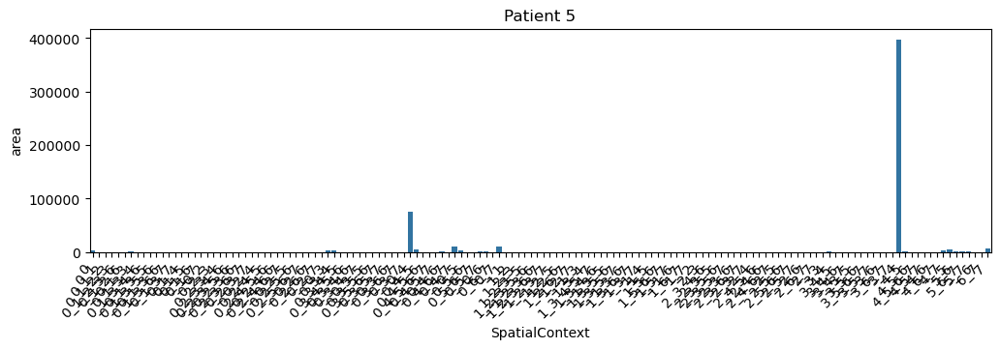

...

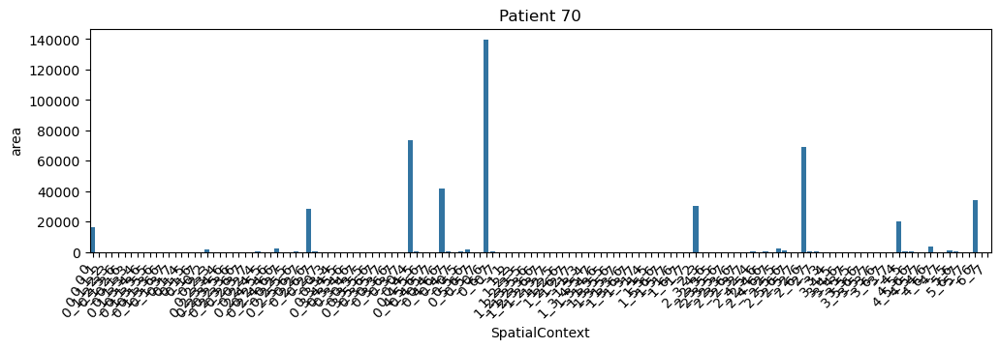

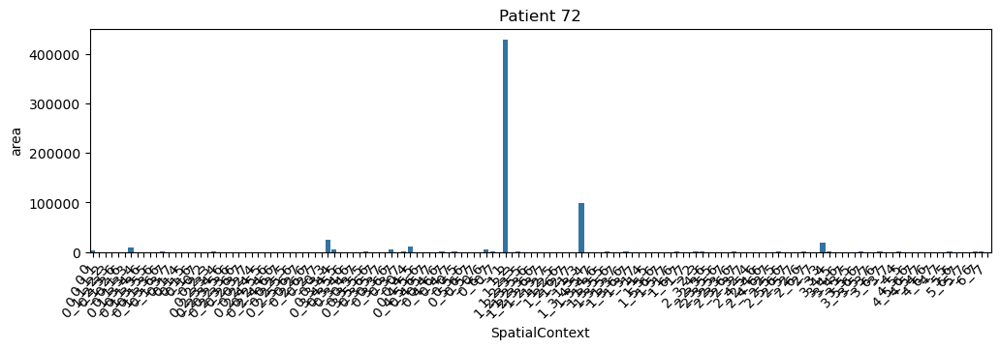

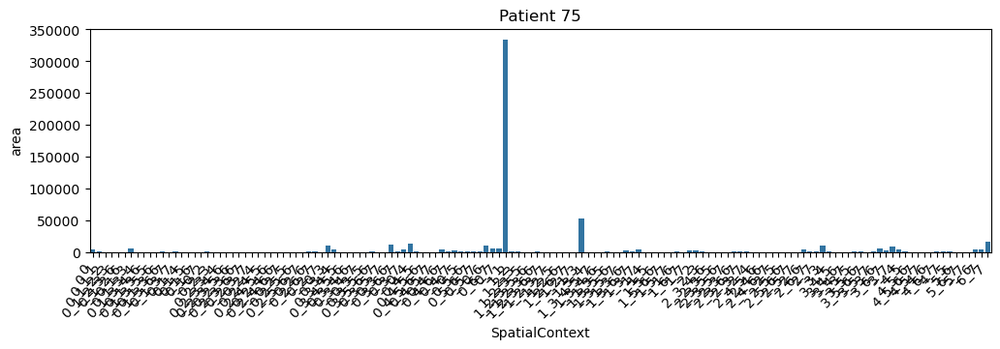

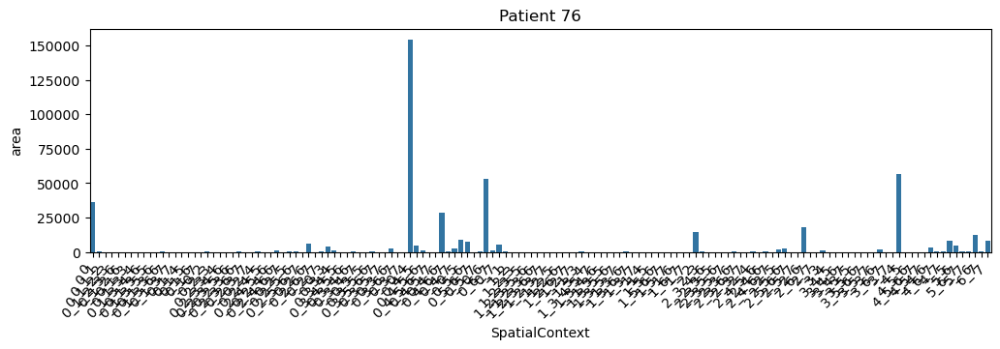

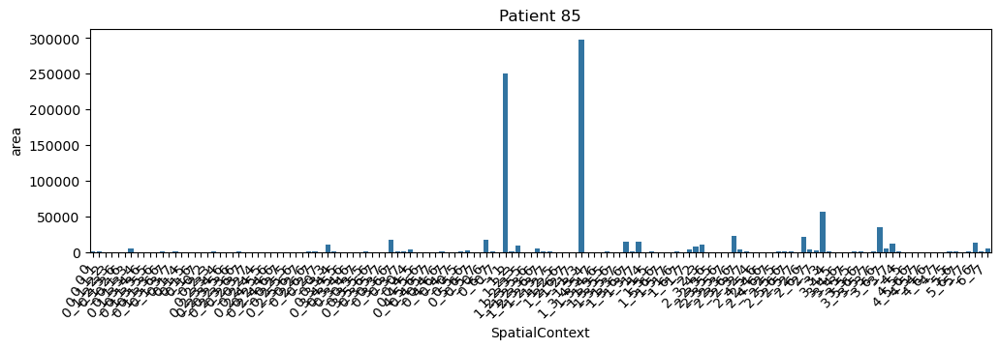

In [30]:
for patient in areas['DFCI_id'].unique():
    areas_tmp=areas[areas['DFCI_id']==patient][['SpatialContext','area']]
    plt.figure(figsize=(12,3))
    sns.barplot(data=areas_tmp, x='SpatialContext',y='area')
    plt.xticks(rotation=45,ha='right')
    plt.title(f"Patient {patient}")
    plt.show()

## Ectract results

### Cell proportions

In [31]:
def get_props(adata, cell_type):
    cell_props=adata.obs[['DFCI_id',cell_type]]
    counts = cell_props.groupby(['DFCI_id', cell_type]).size().reset_index(name='count')
    total_counts = cell_props.groupby('DFCI_id').size().reset_index(name='total_count')
    counts = counts.merge(total_counts, on='DFCI_id')
    counts['proportion'] = counts['count'] / counts['total_count']
    cell_props=counts.pivot_table(index='DFCI_id',columns=cell_type,values='count')
    return cell_props

cell_props_minor=get_props(adata, 'minor_cell_type')
cell_props_medium=get_props(adata, 'medium_cell_type')
cell_props_major=get_props(adata, 'major_cell_type')
cell_props_functional=get_props(adata, 'functional_minor_cell_type')

### CN areas

In [32]:
def get_areas(adata,cluster):
    areas=adata.obs[['DFCI_id',cluster,'area']]
    
    areas = areas.groupby(['DFCI_id', cluster])['area'].sum().reset_index()
    
    total_area = areas.groupby('DFCI_id')['area'].sum().reset_index(name='total_area')
    
    areas = areas.merge(total_area, on='DFCI_id')
    
    areas['proportion'] = areas['area'] / areas['total_area']
    
    areas = areas.drop(columns=['area', 'total_area'])
    areas=areas.pivot_table(index='DFCI_id',columns=cluster,values='proportion')
    return areas

cn_areas = get_areas(adata,'cn_celltypes')

### CN cell props

In [33]:
def get_cluster_props(adata,cluster,celltype):
    celltype_counts=adata.obs[['DFCI_id',cluster,celltype]]
    celltype_counts = celltype_counts.groupby(['DFCI_id', cluster, celltype]).size().reset_index(name='count')
    total_counts = celltype_counts.groupby(['DFCI_id', cluster])['count'].sum().reset_index(name='total_count')
    celltype_counts = celltype_counts.merge(total_counts, on=['DFCI_id', cluster])
    celltype_counts['fraction'] = celltype_counts['count'] / celltype_counts['total_count']
    celltype_counts = celltype_counts.pivot_table(index='DFCI_id', columns=[cluster, celltype], values='fraction', fill_value=0)
    celltype_counts.columns = ['_'.join(col).strip() for col in celltype_counts.columns.values]
    celltype_counts=celltype_counts.reset_index()
    return celltype_counts

cn_props_minor=get_cluster_props(adata,'cn_celltypes','minor_cell_type')
cn_props_medium=get_cluster_props(adata,'cn_celltypes','medium_cell_type')
cn_props_major=get_cluster_props(adata,'cn_celltypes','major_cell_type')
cn_props_functional=get_cluster_props(adata,'cn_celltypes','functional_minor_cell_type')

### SC area

In [34]:
sc_areas = get_areas(adata,'SpatialContext')

### SC cell props

In [35]:
sc_props_minor=get_cluster_props(adata,'SpatialContext','minor_cell_type')
sc_props_medium=get_cluster_props(adata,'SpatialContext','medium_cell_type')
sc_props_major=get_cluster_props(adata,'SpatialContext','major_cell_type')
sc_props_functional=get_cluster_props(adata,'SpatialContext','functional_minor_cell_type')

## Save Tables

In [36]:
cell_props_minor.to_csv(f"../tables/{str(int(radius))}_cell_proportions_minor-baseline.csv")
cell_props_medium.to_csv(f"../tables/{str(int(radius))}_cell_proportions_medium-baseline.csv")
cell_props_major.to_csv(f"../tables/{str(int(radius))}_cell_proportions_major-baseline.csv")
cn_areas.to_csv(f"../tables/{str(int(radius))}_CN_areas-baseline.csv")
cn_props_minor.to_csv(f"../tables/{str(int(radius))}_CN_cell_proportions_minor-baseline.csv", index=False)
cn_props_medium.to_csv(f"../tables/{str(int(radius))}_CN_cell_proportions_medium-baseline.csv", index=False)
cn_props_major.to_csv(f"../tables/{str(int(radius))}_CN_cell_proportions_major-baseline.csv", index=False)
sc_areas.to_csv(f"../tables/{str(int(radius))}_SC_areas-baseline.csv")
sc_props_minor.to_csv(f"../tables/{str(int(radius))}_SC_cell_proportions_minor-baseline.csv", index=False)
sc_props_medium.to_csv(f"../tables/{str(int(radius))}_SC_cell_proportions_medium-baseline.csv", index=False)
sc_props_major.to_csv(f"../tables/{str(int(radius))}_SC_cell_proportions_major-baseline.csv", index=False)

cell_props_functional.to_csv(f"../tables/{str(int(radius))}_cell_proportions_functional-baseline.csv")
cn_props_functional.to_csv(f"../tables/{str(int(radius))}_CN_cell_proportions_functional-baseline.csv", index=False)
sc_props_functional.to_csv(f"../tables/{str(int(radius))}_SC_cell_proportions_functional-baseline.csv", index=False)

adata.obs[['library_id','timepoint','DFCI_id',
           'major_cell_type','medium_cell_type','minor_cell_type','functional_minor_cell_type',
           'area',
           'cn_celltypes',
           'SpatialContext']].to_csv(f"../tables/{str(int(radius))}_raw_results-baseline.csv")

## Cell type co-occurrence

Compute probability of finding other cell types at different distance thresholds. Visualize probabilities for Myeloma cells

In [37]:
sq.gr.co_occurrence(adata,
                    cluster_key="major_cell_type",
                    interval=int(radius),
                    n_jobs=15
                   )

  0%|          | 0/11935 [00:00<?, ?/s]

KeyboardInterrupt: 

In [ ]:
sq.pl.co_occurrence(
    adata,
    cluster_key="major_cell_type",
    clusters=['Myeloma'],
    figsize=(15, 4),
)

# Neighbourhood enrichment and interaction analysis:

- for each slide:
    - compute neighbourhood graph at the decided threshold
    - compute interaction and neighbourhood enrichment analyses for minor, medium, major celltypes
    - save results
 
> The interaction matrix quantifies the number of edges that nodes belonging to a given annotation shares with the other annotations. It’s a descriptive statistics of the spatial graph.


> It calculates an enrichment score based on proximity on the connectivity graph of cell clusters. The number of observed events is compared against $N$ permutations and a z-score is computed.

In [ ]:
def subset_adata(adata,patient, radius):
    adata_tmp=adata[adata.obs['DFCI_id']==patient].copy()
    adata_tmp.uns['spatial']={k:v for k,v in adata_tmp.uns['spatial'].items() if k in adata_tmp.obs['library_id']}
    sq.gr.spatial_neighbors(adata_tmp,
                        spatial_key='spatial',
                        library_key='library_id',
                        coord_type='generic',
                        radius=radius,
                        delaunay=False,
                        key_added='ng_six')
    return adata_tmp



def interactions(adata_tmp, patient,celltype):
    mtx=sq.gr.interaction_matrix(
        adata_tmp,
        cluster_key=celltype,
        connectivity_key='ng_six',
        normalized=False,
        copy=True
    )

    mtx=pd.DataFrame(mtx)
    mtx.index=adata_tmp.obs[celltype].cat.categories
    mtx.columns=adata_tmp.obs[celltype].cat.categories
    plt.figure()
    sns.set(font_scale=.7) 
    sns.heatmap(mtx)
    plt.title(f"Interactions patient {patient}")
    plt.show()
    # Create a list to hold the pairwise values
    pairwise_values = []
    column_names = []
    
    # Flatten the matrix while keeping track of indices, avoiding inverted duplicates
    for i in range(len(mtx.columns)):
        for j in range(i, len(mtx.index)):
            if i != j:
                pairwise_values.append(mtx.iloc[i, j])
                column_names.append(f'{mtx.columns[i]}_{mtx.index[j]}')
            else:
                pairwise_values.append(mtx.iloc[i, j])
                column_names.append(f'{mtx.columns[i]}_{mtx.index[j]}')
    
    # Create a DataFrame with one row
    df = pd.DataFrame([pairwise_values], columns=column_names)
    df.index = [patient]
    
    return df


def neighbourhood(adata_tmp, patient,celltype):
    sq.gr.nhood_enrichment(adata_tmp,
                           cluster_key=celltype,
                           library_key='library_id',
                           connectivity_key='ng_six',
                           numba_parallel=False,
                           seed=12345,
                           copy=False,
                           n_jobs=1
                          )
    mtx=adata_tmp.uns[celltype+'_nhood_enrichment']['zscore']

    mtx=pd.DataFrame(mtx)
    mtx.index=adata_tmp.obs[celltype].cat.categories
    mtx.columns=adata_tmp.obs[celltype].cat.categories
    
    plt.figure()
    sns.set(font_scale=.7) 
    sns.heatmap(mtx)
    plt.title(f"Neighbourhood enrichment patient {patient}")
    plt.show()

    # Create a list to hold the pairwise values
    pairwise_values = []
    column_names = []
    
    # Flatten the matrix while keeping track of indices
    for i in mtx.columns:
        for j in mtx.index:
            pairwise_values.append(mtx.loc[i, j])
            column_names.append(f'{i}_{j}')
    
    # Create a DataFrame with one row
    df = pd.DataFrame([pairwise_values], columns=column_names)
    df.index=[patient]
    
    return df

def save_dict(dict,celltype,analysis,radius):
    df = pd.concat(dict).reset_index()
    df.columns = ['DFCI_id' if x=='level_0' else x for x in df.columns]
    df=df.drop(['level_1'],axis=1)
    df.to_csv(f"../tables/{str(int(radius))}_{celltype}_{analysis}-baseline.csv",index=False)

    

def get_interactions_df(adata,radius):
    patients = adata.obs['DFCI_id'].unique()
    interactions_minor={}
    interactions_medium={}
    interactions_major={}
    neighbourhood_minor={}
    neighbourhood_medium={}
    neighbourhood_major={}
    for patient in patients:
        adata_tmp=subset_adata(adata,patient, radius)
        interactions_minor[patient]=interactions(adata_tmp, patient,'minor_cell_type')
        interactions_medium[patient]=interactions(adata_tmp, patient,'medium_cell_type')
        interactions_major[patient]=interactions(adata_tmp, patient,'major_cell_type')
        
        neighbourhood_minor[patient]=neighbourhood(adata_tmp, patient,'minor_cell_type')
        neighbourhood_medium[patient]=neighbourhood(adata_tmp, patient,'medium_cell_type')
        neighbourhood_major[patient]=neighbourhood(adata_tmp, patient,'major_cell_type')        
        del adata_tmp
        gc.collect()


    save_dict(interactions_minor,'minor','interaction',radius)
    save_dict(interactions_medium,'medium','interaction',radius)
    save_dict(interactions_major,'major','interaction',radius)
    
    save_dict(neighbourhood_minor,'minor','neighbourhood',radius)
    save_dict(neighbourhood_medium,'medium','neighbourhood',radius)
    save_dict(neighbourhood_major,'major','neighbourhood',radius)





In [ ]:
get_interactions_df(adata,radius)